**STARTUP INVESTMENT**

This diverse dataset contains information about the startup ecosystem: organizations, funds etc

**PROBLEM DEFINITION**

To use multiple avenues for exploration: Clustering VC funds based on their existing investments

<b>Pre-requisite to use the code</b>
<p>1. Upload the all three (objects.csv,investments.csv,funds.csv) files into root directory<p>
<p>2. Run the code sequentially</p>

In [6]:
# Importing Libraries for Loading Dataset
import numpy as np
import pandas as pd

# Importing required libraries for data visualisation
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from io import StringIO
import plotly.express as px
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
from pyclustering.cluster import cluster_visualizer
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
import networkx as nx
from collections import Counter
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

## Downlaod zip file https://drive.google.com/file/d/1UCssUes-1usP7Xdar8shxSW92NssINqI/view?usp=share_link

In [2]:
# Objects dataset
try:    
    df_objects=pd.read_csv("objects.csv", low_memory=False)
    print(len(df_objects))
    df_objects.head(3)
except:
    print("The object.csv file not found in root directory.")

462651


In [3]:
df_objects['entity_type'].value_counts()

Person          226708
Company         196553
Product          27738
FinancialOrg     11652
Name: entity_type, dtype: int64

There are four types of entity in the dataset. Now check data of each of them

In [4]:
# filtered the product entity type
products = df_objects[
    (df_objects['entity_type'] == 'Product')]
print(len(products))
#products.head(3)

27738


In [5]:
products['name'].value_counts()

Last minute tickets                  2
Videos                               2
Mobile                               2
Easy Video Capture for Windows       2
Sports and Entertainment  tickets    2
                                    ..
Puzzler World XL                     1
Pro Zombie Soccer                    1
Predators                            1
Piyo Blocks 2 HD                     1
Catylist Custom Print/Web Design     1
Name: name, Length: 27733, dtype: int64

Above products entity data are irrelevant to analysis

In [6]:
# filtered the person entity type
persons = df_objects[df_objects['entity_type'] == 'Person']
print(len(persons))
#persons.head(3)

226708


In [7]:
persons['name'].value_counts()

Bob Hebig           40
David Jones         15
David Johnson       14
Mark Johnson        14
Chris Jones         13
                    ..
Peter Arrowsmith     1
Brian Hersman        1
Chris Sells          1
Laten Bett           1
Ramon Peypoch        1
Name: name, Length: 212593, dtype: int64

These are the indivitual persons records, so we are not consider these dataset

In [8]:
# filtered the financial organistion entity type
financialorgs = df_objects[df_objects['entity_type'] == 'FinancialOrg']
print(len(financialorgs))
#financialorgs.head(3)

11652


In [9]:
financialorgs['name'].value_counts()

Busy Angels                2
KfW Bankengruppe           2
Greylock Partners          1
VCE Capital Partners       1
Amorçage Rhône Alpes       1
                          ..
Lynx Equity                1
Social Capital             1
Henniker River Advisors    1
Gateway Global Partners    1
CalSTRS                    1
Name: name, Length: 11648, dtype: int64

Financial organisation data are shows single double rows entry dataset and less in nos, so we have not consider any analysis

In [10]:
# filtered the companies entity type
companys = df_objects[df_objects['entity_type'] == 'Company']
print(len(companys))
#companys.head(3)

196553


In [11]:
companys['name'].value_counts()

BBOescape                         3
International Space University    2
Hot Topic Media Inc.              2
aquatic inf                       2
Olnick Organization               2
                                 ..
Oxford Management Consultants     1
The Distillery Group              1
Moai technologies                 1
Prolin Automation                 1
Closet Couture                    1
Name: name, Length: 196506, dtype: int64

As per our assignment startup, we are taking the dataset of companys and have a analysis with them

In [12]:
df_objects.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 462651 entries, 0 to 462650
Data columns (total 40 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   462651 non-null  object 
 1   entity_type          462651 non-null  object 
 2   entity_id            462651 non-null  int64  
 3   parent_id            27715 non-null   object 
 4   name                 462649 non-null  object 
 5   normalized_name      462620 non-null  object 
 6   permalink            462651 non-null  object 
 7   category_code        123186 non-null  object 
 8   status               462651 non-null  object 
 9   founded_at           100441 non-null  object 
 10  closed_at            2809 non-null    object 
 11  domain               174942 non-null  object 
 12  homepage_url         174942 non-null  object 
 13  twitter_username     126089 non-null  object 
 14  logo_url             208850 non-null  object 
 15  logo_width       

The dataset contents lot of irrelevents fields, so we should drop them to better analysis

In [13]:
df_objects.drop(["created_at","updated_at", "logo_url", "logo_width",
                 "overview", "entity_id","parent_id","normalized_name", 
                 "logo_height","short_description", "created_at", "updated_at", 
                 "twitter_username","relationships", "domain", "homepage_url", 
                 "overview", "tag_list","city", "region", "state_code",
                 "description", "created_by", "first_milestone_at",
                 "last_milestone_at","permalink","closed_at", "first_funding_at",
                 "last_funding_at"], axis="columns", inplace=True)
df_objects.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 462651 entries, 0 to 462650
Data columns (total 14 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   462651 non-null  object 
 1   entity_type          462651 non-null  object 
 2   name                 462649 non-null  object 
 3   category_code        123186 non-null  object 
 4   status               462651 non-null  object 
 5   founded_at           100441 non-null  object 
 6   country_code         95043 non-null   object 
 7   first_investment_at  16956 non-null   object 
 8   last_investment_at   16956 non-null   object 
 9   investment_rounds    462651 non-null  int64  
 10  invested_companies   462651 non-null  int64  
 11  funding_rounds       462651 non-null  int64  
 12  funding_total_usd    462651 non-null  float64
 13  milestones           462651 non-null  int64  
dtypes: float64(1), int64(4), object(9)
memory usage: 49.4+ MB


In [14]:
df_objects['status'].value_counts()

operating      443663
acquired         9394
live             4349
closed           2773
ipo              1134
beta              780
development       226
private           219
alpha             113
Name: status, dtype: int64

The status field data shows that most of them belong to **"operating" status** 

In [15]:
df_objects['category_code'].value_counts()

software            17922
web                 15118
other               13617
ecommerce            9065
games_video          7520
mobile               6862
advertising          6098
consulting           5006
enterprise           4441
biotech              4430
hardware             2951
education            2901
public_relations     2846
network_hosting      2350
search               2182
cleantech            1940
health               1698
finance              1386
social               1310
security             1171
medical              1153
analytics            1022
legal                1012
travel                936
local                 785
hospitality           768
news                  768
semiconductor         696
manufacturing         680
sports                675
music                 581
fashion               563
photo_video           544
transportation        489
real_estate           474
messaging             296
automotive            291
design                281
nonprofit   

In [16]:
df_objects['country_code'].value_counts()

USA    55584
GBR     7957
IND     4057
CAN     4005
DEU     2157
       ...  
GIN        1
NRU        1
HMI        1
HND        1
WSM        1
Name: country_code, Length: 177, dtype: int64

In [17]:
df_objects[df_objects['entity_type'] == 'Company']['name'].value_counts()

BBOescape                         3
International Space University    2
Hot Topic Media Inc.              2
aquatic inf                       2
Olnick Organization               2
                                 ..
Oxford Management Consultants     1
The Distillery Group              1
Moai technologies                 1
Prolin Automation                 1
Closet Couture                    1
Name: name, Length: 196506, dtype: int64

**The final objects dataset is now filtered and looks like the following:**

In [18]:
df_objects[df_objects['entity_type'] == 'Company'].head(3)

,id,entity_type,name,category_code,status,founded_at,country_code,first_investment_at,last_investment_at,investment_rounds,invested_companies,funding_rounds,funding_total_usd,milestones
0,c:1,Company,Wetpaint,web,operating,2005-10-17,USA,NaN,NaN,0,0,3,39750000.0,5
1,c:10,Company,Flektor,games_video,acquired,NaN,USA,NaN,NaN,0,0,0,0.0,0
2,c:100,Company,There,games_video,acquired,NaN,USA,NaN,NaN,0,0,0,0.0,4


Next: Checking the given master data **Investments** csv file

In [19]:
# Investments dataset
try:
    df_investments=pd.read_csv("investments.csv")
    print(len(df_investments))
    df_investments.head(3)
except:
    print("The investments.csv file not found in root directory.")

80902


In the above investment dataset some fields are not relevent, so we should drop them to get a filtered dataset

In [20]:
# drop the columns from investments dataset
df_investments.drop(["id","funding_round_id",
                     "created_at","updated_at"], axis="columns", inplace=True)
df_investments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80902 entries, 0 to 80901
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   funded_object_id    80902 non-null  object
 1   investor_object_id  80902 non-null  object
dtypes: object(2)
memory usage: 1.2+ MB


In [21]:
df_investments['funded_object_id'].value_counts()

c:169876    58
c:28535     58
c:32499     54
c:6460      53
c:16284     49
            ..
c:166933     1
c:7621       1
c:184455     1
c:184484     1
c:209871     1
Name: funded_object_id, Length: 21607, dtype: int64

The dataset ***objects*** contents "id" column which is common to investment dataset column name "funded_object_id" so we rename the dataset objects column "id" --> "funded_object_id" to merge both datasets

In [22]:
# Rename id in objects.csv to funded_object_id
df_objects.rename(columns={'id':'funded_object_id'}, inplace=True)
df_objects.columns

Index(['funded_object_id', 'entity_type', 'name', 'category_code', 'status',
       'founded_at', 'country_code', 'first_investment_at',
       'last_investment_at', 'investment_rounds', 'invested_companies',
       'funding_rounds', 'funding_total_usd', 'milestones'],
      dtype='object')

Now we have to merge both the dataset with common column name "funded_object_id"

In [23]:
# Merging the objects & investments dataset
df_objects_investments = df_investments.merge(df_objects, on='funded_object_id')
print(len(df_objects_investments))
df_objects_investments.head(3)

80570


,funded_object_id,investor_object_id,entity_type,name,category_code,status,founded_at,country_code,first_investment_at,last_investment_at,investment_rounds,invested_companies,funding_rounds,funding_total_usd,milestones
0,c:4,f:1,Company,Digg,news,acquired,2004-10-11,USA,NaN,NaN,0,0,4,45000000.0,8
1,c:4,f:2,Company,Digg,news,acquired,2004-10-11,USA,NaN,NaN,0,0,4,45000000.0,8
2,c:4,f:1,Company,Digg,news,acquired,2004-10-11,USA,NaN,NaN,0,0,4,45000000.0,8


In [24]:
df_objects_investments.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 80570 entries, 0 to 80569
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   funded_object_id     80570 non-null  object 
 1   investor_object_id   80570 non-null  object 
 2   entity_type          80570 non-null  object 
 3   name                 80570 non-null  object 
 4   category_code        78704 non-null  object 
 5   status               80570 non-null  object 
 6   founded_at           68590 non-null  object 
 7   country_code         77875 non-null  object 
 8   first_investment_at  921 non-null    object 
 9   last_investment_at   921 non-null    object 
 10  investment_rounds    80570 non-null  int64  
 11  invested_companies   80570 non-null  int64  
 12  funding_rounds       80570 non-null  int64  
 13  funding_total_usd    80570 non-null  float64
 14  milestones           80570 non-null  int64  
dtypes: float64(1), int64(4), object(10)


Since "first_investment_at" and "last_investment_at" contain only 921  non-null rows, so these columns are not relevent to analysis. Therefore we should drop them and filter the dataset

In [25]:
df_objects_investments.drop(['first_investment_at', 'last_investment_at'], axis="columns", inplace=True)
df_objects_investments.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 80570 entries, 0 to 80569
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   funded_object_id    80570 non-null  object 
 1   investor_object_id  80570 non-null  object 
 2   entity_type         80570 non-null  object 
 3   name                80570 non-null  object 
 4   category_code       78704 non-null  object 
 5   status              80570 non-null  object 
 6   founded_at          68590 non-null  object 
 7   country_code        77875 non-null  object 
 8   investment_rounds   80570 non-null  int64  
 9   invested_companies  80570 non-null  int64  
 10  funding_rounds      80570 non-null  int64  
 11  funding_total_usd   80570 non-null  float64
 12  milestones          80570 non-null  int64  
dtypes: float64(1), int64(4), object(8)
memory usage: 8.6+ MB


In [26]:
df_objects_investments["status"].value_counts()

operating    63268
acquired     11594
closed        3894
ipo           1814
Name: status, dtype: int64

In [27]:
df_objects_investments["entity_type"].value_counts()

Company    80570
Name: entity_type, dtype: int64

The above dataset contains only company's data

Next: Checking the given master data **funds** csv file

In [28]:
# Funds dataset
try:
    df_funds=pd.read_csv("funds.csv")
    print(len(df_funds))
    df_funds.head(3)
except:
    print("The funds.csv file not found in root directory.")

1564


In [29]:
df_funds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1564 entries, 0 to 1563
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    1564 non-null   int64  
 1   fund_id               1564 non-null   int64  
 2   object_id             1564 non-null   object 
 3   name                  1564 non-null   object 
 4   funded_at             1449 non-null   object 
 5   raised_amount         1564 non-null   float64
 6   raised_currency_code  1564 non-null   object 
 7   source_url            1272 non-null   object 
 8   source_description    1218 non-null   object 
 9   created_at            1564 non-null   object 
 10  updated_at            1564 non-null   object 
dtypes: float64(1), int64(2), object(8)
memory usage: 134.5+ KB


The funds dataset contains some irrelevent columns, so we should remove them.

In [30]:
df_funds.drop(['id', 'fund_id', 'name', 'source_url', 'source_description', 
               'created_at', 'updated_at'], axis='columns', inplace=True)
df_funds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1564 entries, 0 to 1563
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   object_id             1564 non-null   object 
 1   funded_at             1449 non-null   object 
 2   raised_amount         1564 non-null   float64
 3   raised_currency_code  1564 non-null   object 
dtypes: float64(1), object(3)
memory usage: 49.0+ KB


The funds dataset contains "object_id" column which is equivalent to our merged dataset df_objects_investments column name "investor_object_id", so we rename "object_id" --> "investor_object_id" for joining both the datasets

In [31]:
df_funds.rename(columns={'object_id':'investor_object_id'}, inplace=True)

In [32]:
df_funds.columns

Index(['investor_object_id', 'funded_at', 'raised_amount',
       'raised_currency_code'],
      dtype='object')

In [33]:
df_funds['investor_object_id'].value_counts()

f:12      10
f:3576     9
f:116      8
f:379      8
f:1606     8
          ..
f:7635     1
f:3413     1
f:4382     1
f:8964     1
f:5920     1
Name: investor_object_id, Length: 1026, dtype: int64

Now joining all the 3 datasets to form a single dataset.

In [34]:
df_objects_investments_funds = df_objects_investments.merge(df_funds, on='investor_object_id')
df_objects_investments_funds.head(3)

,funded_object_id,investor_object_id,entity_type,name,category_code,status,founded_at,country_code,investment_rounds,invested_companies,funding_rounds,funding_total_usd,milestones,funded_at,raised_amount,raised_currency_code
0,c:4,f:1,Company,Digg,news,acquired,2004-10-11,USA,0,0,4,45000000.0,8,2013-09-10,1.000000e+09,USD
1,c:4,f:1,Company,Digg,news,acquired,2004-10-11,USA,0,0,4,45000000.0,8,2011-03-01,1.000000e+09,USD
2,c:4,f:1,Company,Digg,news,acquired,2004-10-11,USA,0,0,4,45000000.0,8,2005-11-14,5.000000e+08,USD


In [35]:
df_objects_investments_funds.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 71811 entries, 0 to 71810
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   funded_object_id      71811 non-null  object 
 1   investor_object_id    71811 non-null  object 
 2   entity_type           71811 non-null  object 
 3   name                  71811 non-null  object 
 4   category_code         70003 non-null  object 
 5   status                71811 non-null  object 
 6   founded_at            62685 non-null  object 
 7   country_code          70041 non-null  object 
 8   investment_rounds     71811 non-null  int64  
 9   invested_companies    71811 non-null  int64  
 10  funding_rounds        71811 non-null  int64  
 11  funding_total_usd     71811 non-null  float64
 12  milestones            71811 non-null  int64  
 13  funded_at             69562 non-null  object 
 14  raised_amount         71811 non-null  float64
 15  raised_currency_cod

In [36]:
df_objects_investments_funds.head(3)

,funded_object_id,investor_object_id,entity_type,name,category_code,status,founded_at,country_code,investment_rounds,invested_companies,funding_rounds,funding_total_usd,milestones,funded_at,raised_amount,raised_currency_code
0,c:4,f:1,Company,Digg,news,acquired,2004-10-11,USA,0,0,4,45000000.0,8,2013-09-10,1.000000e+09,USD
1,c:4,f:1,Company,Digg,news,acquired,2004-10-11,USA,0,0,4,45000000.0,8,2011-03-01,1.000000e+09,USD
2,c:4,f:1,Company,Digg,news,acquired,2004-10-11,USA,0,0,4,45000000.0,8,2005-11-14,5.000000e+08,USD


Checking percentage of missing data in each columns of the final dataset.

In [37]:
# summing up the missing values (column-wise) and displaying fraction of NaNs
round(100*(df_objects_investments_funds.isnull().sum()/len(df_objects_investments_funds.index)), 2)

funded_object_id         0.00
investor_object_id       0.00
entity_type              0.00
name                     0.00
category_code            2.52
status                   0.00
founded_at              12.71
country_code             2.46
investment_rounds        0.00
invested_companies       0.00
funding_rounds           0.00
funding_total_usd        0.00
milestones               0.00
funded_at                3.13
raised_amount            0.00
raised_currency_code     0.00
dtype: float64

Now we have to check the total number of null values count.

In [38]:
df_objects_investments_funds.isna().sum()

funded_object_id           0
investor_object_id         0
entity_type                0
name                       0
category_code           1808
status                     0
founded_at              9126
country_code            1770
investment_rounds          0
invested_companies         0
funding_rounds             0
funding_total_usd          0
milestones                 0
funded_at               2249
raised_amount              0
raised_currency_code       0
dtype: int64

In [39]:
#Dropping rows based on null values in columns (1) funded_at and (2) founded_at
df_objects_investments_funds = df_objects_investments_funds[
    ~(df_objects_investments_funds['funded_at'].isnull() | 
      df_objects_investments_funds['founded_at'].isnull())]

In [40]:
df_objects_investments_funds.isna().sum()

funded_object_id          0
investor_object_id        0
entity_type               0
name                      0
category_code           792
status                    0
founded_at                0
country_code            608
investment_rounds         0
invested_companies        0
funding_rounds            0
funding_total_usd         0
milestones                0
funded_at                 0
raised_amount             0
raised_currency_code      0
dtype: int64

In [41]:
#Dropping rows based on null values in columns (1) country_code and (2) category_code
df_objects_investments_funds = df_objects_investments_funds[
    ~(df_objects_investments_funds['country_code'].isnull() | 
      df_objects_investments_funds['category_code'].isnull())]

In [42]:
df_objects_investments_funds.isna().sum()

funded_object_id        0
investor_object_id      0
entity_type             0
name                    0
category_code           0
status                  0
founded_at              0
country_code            0
investment_rounds       0
invested_companies      0
funding_rounds          0
funding_total_usd       0
milestones              0
funded_at               0
raised_amount           0
raised_currency_code    0
dtype: int64

Now we have the filtered data without any null values. This should help us have a better analysis and model building

In [43]:
print(len(df_objects_investments_funds))
df_objects_investments_funds.head(3)

59446


,funded_object_id,investor_object_id,entity_type,name,category_code,status,founded_at,country_code,investment_rounds,invested_companies,funding_rounds,funding_total_usd,milestones,funded_at,raised_amount,raised_currency_code
0,c:4,f:1,Company,Digg,news,acquired,2004-10-11,USA,0,0,4,45000000.0,8,2013-09-10,1.000000e+09,USD
1,c:4,f:1,Company,Digg,news,acquired,2004-10-11,USA,0,0,4,45000000.0,8,2011-03-01,1.000000e+09,USD
2,c:4,f:1,Company,Digg,news,acquired,2004-10-11,USA,0,0,4,45000000.0,8,2005-11-14,5.000000e+08,USD


Identify duplicates records in the final dataset

In [44]:
df_duplicates=df_objects_investments_funds.duplicated()
sum(df_duplicates)

21611

Dropping duplicate values from dataset

In [45]:
df_objects_investments_funds=df_objects_investments_funds.drop_duplicates()

After removing dulicate values, confirming that no duplicate values are still left in dataset.

In [46]:
sum(df_objects_investments_funds.duplicated())

0

In [47]:
print('Total number of data points (rows) : ',len(df_objects_investments_funds))
df_objects_investments_funds.head(3)

Total number of data points (rows) :  37835


,funded_object_id,investor_object_id,entity_type,name,category_code,status,founded_at,country_code,investment_rounds,invested_companies,funding_rounds,funding_total_usd,milestones,funded_at,raised_amount,raised_currency_code
0,c:4,f:1,Company,Digg,news,acquired,2004-10-11,USA,0,0,4,45000000.0,8,2013-09-10,1.000000e+09,USD
1,c:4,f:1,Company,Digg,news,acquired,2004-10-11,USA,0,0,4,45000000.0,8,2011-03-01,1.000000e+09,USD
2,c:4,f:1,Company,Digg,news,acquired,2004-10-11,USA,0,0,4,45000000.0,8,2005-11-14,5.000000e+08,USD


<h1>Graphical exploratory data analysis (EDA)</h1>

Considered the **"current status"** of the startup companies with graphical representations

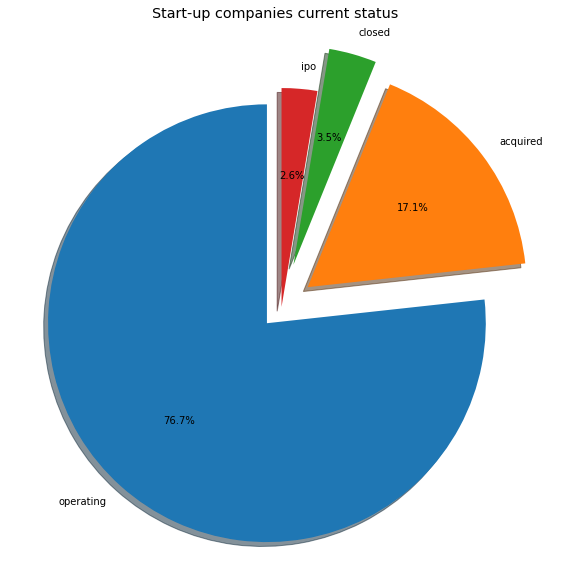

In [48]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
plt.rcParams['figure.figsize'] = 10,10
labels = df_objects_investments_funds['status'].value_counts().index.tolist()
sizes = df_objects_investments_funds['status'].value_counts().tolist()
explode = (0.1, 0.15, 0.2, 0)

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',shadow=True, startangle=90)
ax1.axis('equal')
plt.title("Start-up companies current status", fontdict=None, position= [0.48,1], size = 'x-large')

plt.show()

The above graph highlights that 76.7% percentage of the startup companies have **"operating"** status

In [49]:
# checking with category code
print("Unique Category Codes : ",len(df_objects_investments['category_code'].unique()))

Unique Category Codes :  43


In [50]:
print("Value Counts for each Category Code : ")
df_objects_investments_funds['category_code'].value_counts()

Value Counts for each Category Code : 


software            5658
web                 3445
enterprise          3351
mobile              2982
advertising         2298
biotech             2281
ecommerce           1958
games_video         1777
analytics           1328
cleantech           1267
hardware            1219
semiconductor        950
finance              854
security             827
network_hosting      724
social               686
medical              574
education            546
health               516
fashion              477
search               455
public_relations     420
travel               393
messaging            372
other                369
news                 285
music                265
hospitality          263
manufacturing        200
photo_video          165
consulting           159
real_estate          153
nanotech             125
automotive           112
transportation       109
sports                57
nonprofit             50
legal                 50
pets                  45
design                40


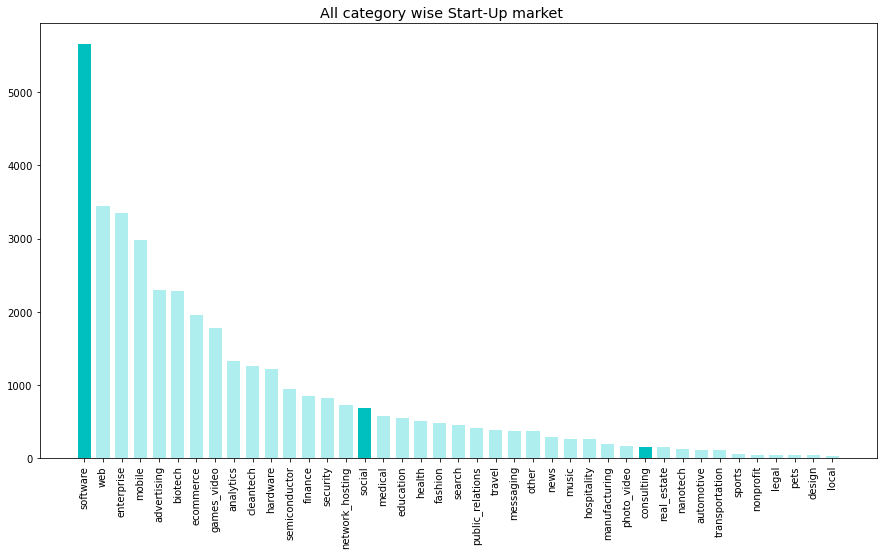

In [51]:
# Grahically representing the "category code" data
plt.rcParams['figure.figsize'] = 15,8
height = df_objects_investments_funds['category_code'].value_counts().tolist()
bars =  df_objects_investments_funds['category_code'].value_counts().index.tolist()
y_pos = np.arange(len(bars))
plt.bar(y_pos, height , width=0.7 ,color= ['c']+['paleturquoise']*14)
plt.xticks(y_pos, bars)
plt.xticks(rotation=90)
plt.title("All category wise Start-Up market", fontdict=None, position= [0.48,1.05], size = 'x-large')
plt.show()

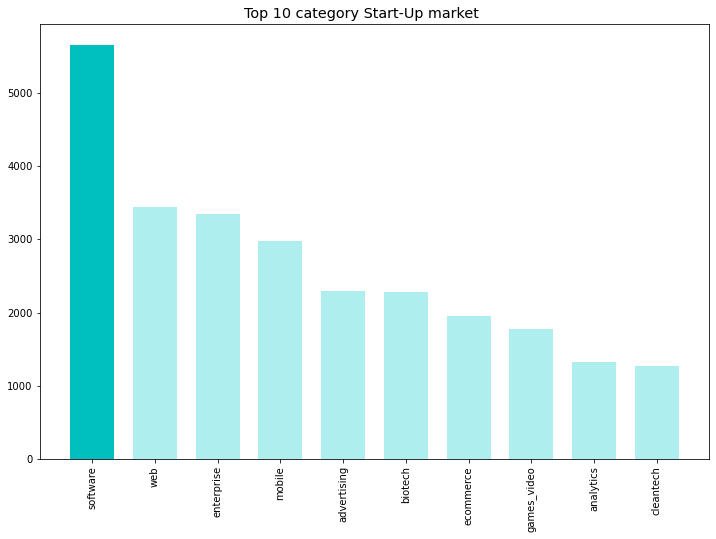

In [52]:
# Taking the top 10 category codes for clearer bar graph
plt.rcParams['figure.figsize'] = 12,8
height = df_objects_investments_funds['category_code'].value_counts()[:10].tolist()
bars =  df_objects_investments_funds['category_code'].value_counts()[:10].index.tolist()
y_pos = np.arange(len(bars))
plt.bar(y_pos, height , width=0.7 ,color= ['c']+['paleturquoise']*14)
plt.xticks(y_pos, bars)
plt.xticks(rotation=90)
plt.title("Top 10 category Start-Up market", fontdict=None, position= [0.48,1.05], size = 'x-large')
plt.show()

In [53]:
# Create a function for categorical keywords (Generally used for display boards)
def count_word(df, ref_col, lists):
    keyword_count = dict()
    for s in lists: keyword_count[s] = 0
    for list_keywords in df[ref_col].str.split('|'):        
        if type(list_keywords) == float and pd.isnull(list_keywords): continue        
        for s in [s for s in list_keywords if s in lists]: 
            if pd.notnull(s): keyword_count[s] += 1
    # convert the dictionary in a list to sort the keywords by frequency
    keyword_occurences = []
    for k,v in keyword_count.items():
        keyword_occurences.append([k,v])
    keyword_occurences.sort(key = lambda x:x[1], reverse = True)
    return keyword_occurences, keyword_count

def makeCloud(Dict,name,color):
    words = dict()
    for s in Dict:
        words[s[0]] = s[1]
        wordcloud = WordCloud(width=1600, height=800, background_color=color, max_words=50, max_font_size=500, normalize_plurals=False)
        wordcloud.generate_from_frequencies(words)

    fig = plt.figure(figsize=(12, 8))
    plt.title(name)
    plt.imshow(wordcloud)
    plt.axis('off')

    plt.show()

In [54]:
set_keywords = set()
for lists_keywords in df_objects_investments['category_code'].str.split('|').values:
    if isinstance(lists_keywords, float): continue  # only happen if lists_keywords = NaN
    set_keywords = set_keywords.union(lists_keywords)

In [55]:
keyword_occurences, dum = count_word(df_objects_investments, 'category_code', set_keywords)

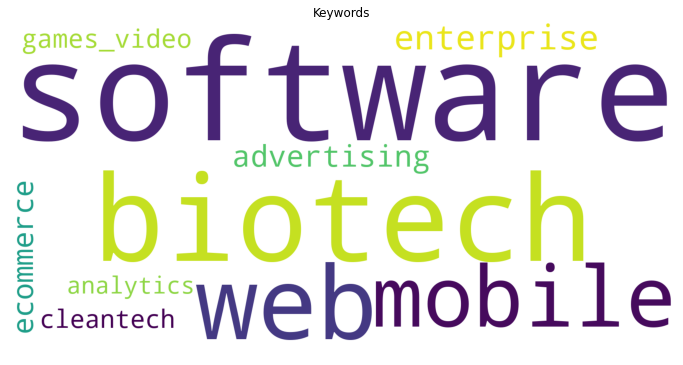

In [56]:
# Create categorical display of 10 keywords for presentation purpose
makeCloud(keyword_occurences[0:10],"Keywords","White")

Checking with company's **"country code"**

In [57]:
df_objects_investments_funds['country_code'].value_counts()

USA    30285
GBR     1946
FRA      665
ISR      613
CAN      612
       ...  
JOR        1
SVN        1
EGY        1
COL        1
HRV        1
Name: country_code, Length: 67, dtype: int64

The above data shows that most of the founded companies are from the USA.

In [58]:
# converting object data type to datetime to analyze year-wise data 
df_objects_investments_funds['founded_at'] = df_objects_investments_funds['founded_at'].apply(pd.to_datetime, errors='coerce')
df_objects_investments_funds['funded_at'] = df_objects_investments_funds['funded_at'].apply(pd.to_datetime, errors='coerce')

In [59]:
# creating new column "founded year"
df_objects_investments_funds['founded_year'] = df_objects_investments_funds['founded_at'].dt.year
# creating new column "funded year"
df_objects_investments_funds['funded_year'] = df_objects_investments_funds['funded_at'].dt.year

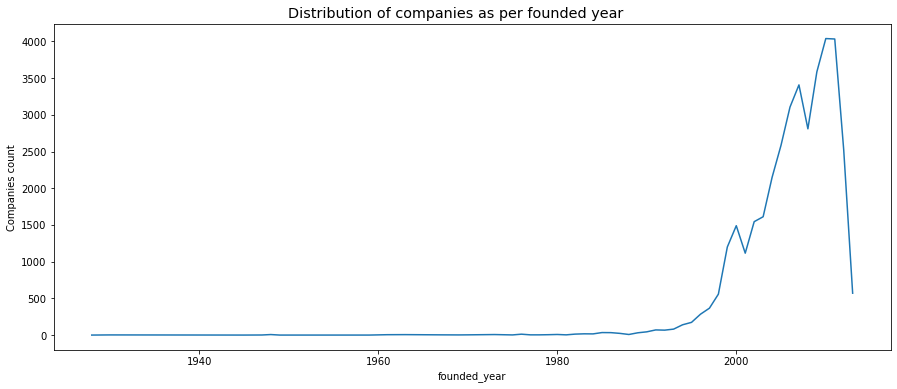

In [60]:
# graphically presenting the "founded year" wise companies
plt.rcParams['figure.figsize'] = 15,6
df_objects_investments_funds['name'].groupby(df_objects_investments_funds["founded_year"]).count().plot(kind="line")
plt.ylabel('Companies count')
plt.title("Distribution of companies as per founded year", fontdict=None, position= [0.48,1.05], size = 'x-large')
plt.show()

In [61]:
print("Value counts of companies as per Current Status:")
df_objects_investments_funds['status'].value_counts()

Value counts of companies as per Current Status:


operating    29031
acquired      6483
closed        1328
ipo            993
Name: status, dtype: int64

In [62]:
# Changing Strings to Int type for Interactive graphical representation & Sorting
status_sort = {
    'operating': 0,
    'aqcuired': 1,
    'ipo': 2,
    'closed': 3
}

In [63]:
# creating scatter plot graph for companies vs funding usd amount along with current status
fig = px.scatter(
    #df_objects_investments_funds[df_objects_investments_funds['funding_total_usd']!=0]
    df_objects_investments_funds[df_objects_investments_funds['funding_total_usd']>3e8]
    .sort_values(by='status', key=lambda x: x.map(status_sort)),
    x='name',
    y='funding_total_usd',
    color='status',
    title='',
    labels={'name': 'company', 'funding_total_usd': 'funding (USD)'},
)
fig.show()

In [64]:
# checking the funded amount currency code
df_objects_investments_funds['raised_currency_code'].value_counts()

USD    34156
EUR     2815
GBP      767
CAD       72
JPY       19
SEK        4
AUD        2
Name: raised_currency_code, dtype: int64

[Text(0.5, 1.0, 'Number of companies funded as per currency code per year')]

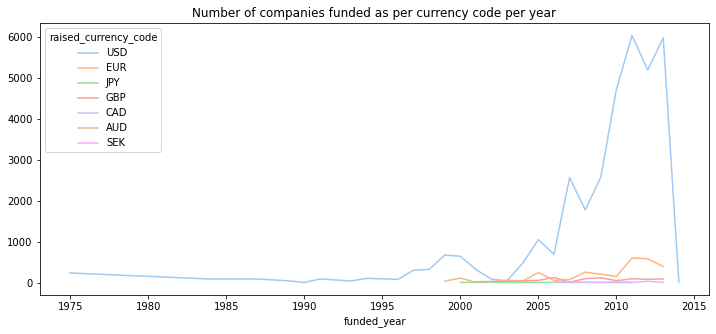

In [65]:
# graphical representation of year wise funded currency code
funded_currency_year = df_objects_investments_funds.filter(
    ['funded_year', 'raised_currency_code']
).groupby(['funded_year', 'raised_currency_code']).size()

plt.figure(figsize=(12,5))
sns.lineplot(
    data = funded_currency_year,
    x = 'funded_year',
    y = funded_currency_year.values,
    hue = 'raised_currency_code',
    palette='pastel'
).set(title='Number of companies funded as per currency code per year')

The above graph shows most of the companies belong to currency code - USD

In [66]:
# funded year and currency wise raised amount
df_currecy_raised = pd.DataFrame(df_objects_investments_funds.groupby(['raised_currency_code'])['raised_amount'].sum()).reset_index()
df_currecy_raised

,raised_currency_code,raised_amount
0,AUD,4.000000e+07
1,CAD,6.078000e+09
2,EUR,6.092981e+11
3,GBP,3.794100e+10
4,JPY,9.780000e+10
5,SEK,8.000000e+07
6,USD,1.482458e+13


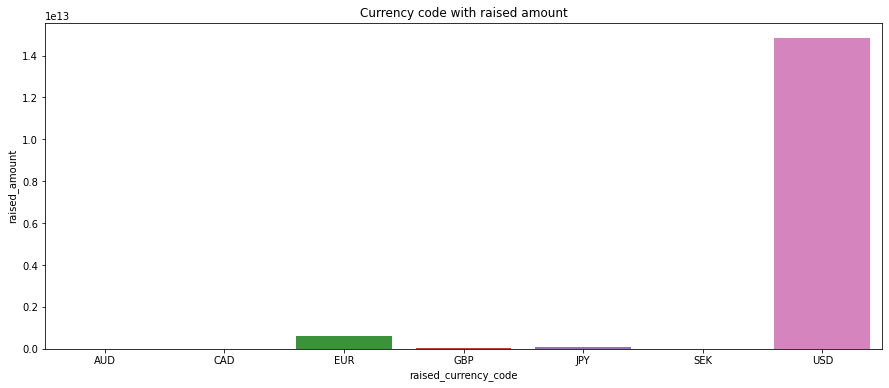

In [67]:
# Graphical representation
g = sns.barplot(x=df_currecy_raised['raised_currency_code'], y= df_currecy_raised['raised_amount'],data=df_currecy_raised).set(title='Currency code with raised amount')

Above currency wise total raised amount shows maximum amount is taken in USD

In [68]:
print('Unique Countries:', len(df_objects_investments_funds['country_code'].unique()))
print('Top 10 countries :')
print('Country | Companies')
df_objects_investments_funds['country_code'].value_counts()[:10]

Unique Countries: 67
Top 10 countries :
Country | Companies


USA    30285
GBR     1946
FRA      665
ISR      613
CAN      612
DEU      568
IND      509
CHN      419
ESP      311
IRL      171
Name: country_code, dtype: int64

Most of the startup companies are from USA

In [69]:
df_objects_investments_funds['count'] = 1
country_market = df_objects_investments_funds[['count','country_code','category_code']].groupby(['country_code','category_code']).agg({'count': 'sum'})
# Change: groupby state_office and divide by sum
country_market_pct = country_market.groupby(level=0).apply(lambda x:
                                                 100 * x / float(x.sum()))
country_market_pct.reset_index(inplace = True)

In [70]:
USA_market_pct = country_market_pct[country_market_pct['country_code'] == "USA"]
USA_market_pct = USA_market_pct.sort_values('count',ascending = False)[0:10]

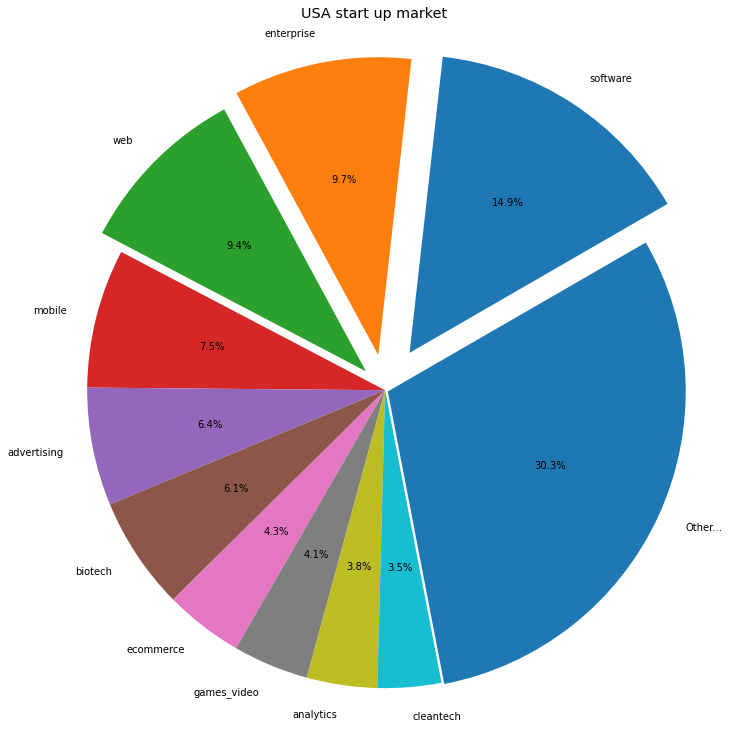

In [71]:
# filtered data for country USA
plt.rcParams['figure.figsize'] =10,10
labels = list(USA_market_pct['category_code'])+['Other...']
sizes = list(USA_market_pct['count'])+[100-USA_market_pct['count'].sum()]
explode = (0.15, 0.12, 0.09,0,0,0,0,0,0,0,0.01)

plt.pie(sizes, explode = explode,labels=labels, autopct='%1.1f%%',
        shadow=False, startangle=30)
plt.axis('equal')
plt.tight_layout()
plt.title("USA start up market", fontdict=None, position= [0.48,1.1], size = 'x-large')

plt.show()

For USA, Most of start up market is about Software & Technology

<b>Analysis for country : INDIA</b>


In [72]:
IND_market_pct = country_market_pct[country_market_pct['country_code'] == "IND"]
IND_market_pct = IND_market_pct.sort_values('count',ascending = False)[0:10]

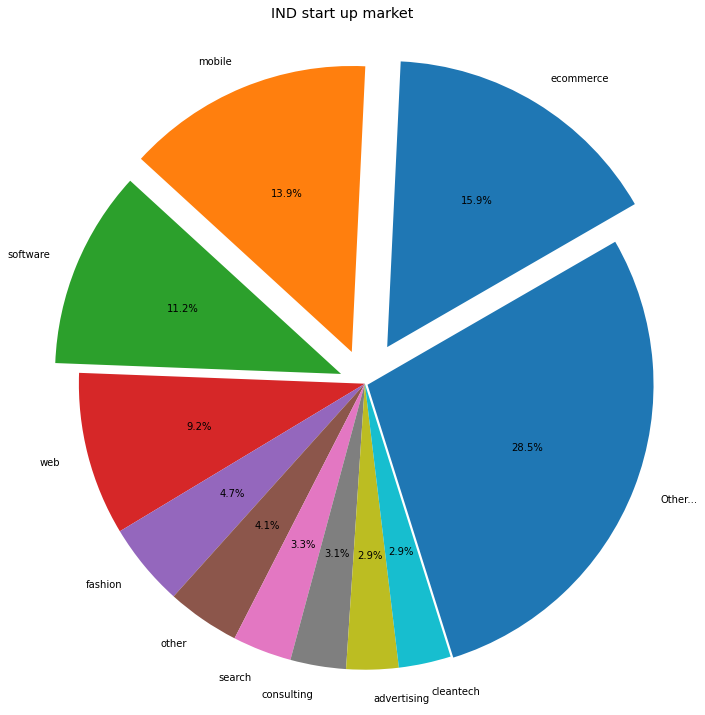

In [73]:
plt.rcParams['figure.figsize'] =10,10
labels = list(IND_market_pct['category_code'])+['Other...']
sizes = list(IND_market_pct['count'])+[100-IND_market_pct['count'].sum()]
Nones = (0.15, 0.12, 0.09,0,0,0,0.01)

plt.pie(sizes, explode = explode ,labels=labels, autopct='%1.1f%%',
        shadow=False, startangle=30)
plt.axis('equal')
plt.tight_layout()
plt.title("IND start up market", fontdict=None, position= [0.48,1.1], size = 'x-large')

plt.show()

For IND, Most of start up market are from ecommerce, mobile & software

Using domain knowledge grouping of category codes is done:

In [74]:
# grouping categories together by their categorical status with new field category_group
def group_categories(data:pd.DataFrame) -> pd.Series:
    tech_cat = [
        'software', 'web', 'biotech', 'games_video', 'network_hosting',
        'cleantech', 'nanotech', 'ecommerce', 'search', 'social', 'news',
        'messaging', 'photo_video', 'music'
    ]

    services_cat = [
        'hospitality', 'pets', 'medical', 'health', 'education', 'security',
        'travel', 'public_relations',
    ]

    business_cat = [
        'advertising', 'enterprise', 'consulting', 'analytics', 'ecommerce',
        'finance', 'legal'
    ]

    manufacturing_cat = [
        'mobile', 'manufacturing', 'design', 'hardware', 'automotive', 'sports', 'transportation', 
        'fashion', 'real_estate',  'semiconductor', 'local'
    ]

    other_cat = [
        'other',
    ]

    if data['category_code'] in tech_cat:
        return 'tech'
    elif data['category_code'] in services_cat:
        return 'service'
    elif data['category_code'] in business_cat:
        return 'business'
    elif data['category_code'] in manufacturing_cat:
        return 'manufacturing'
    else:
        return 'other'
    
df_objects_investments_funds['category_group'] = df_objects_investments_funds.apply(group_categories, axis=1)

In [75]:
df_objects_investments_funds['category_group'].value_counts()

tech             19463
business          8040
manufacturing     6329
service           3584
other              419
Name: category_group, dtype: int64

[Text(0.5, 1.0, 'Founded year wise category group')]

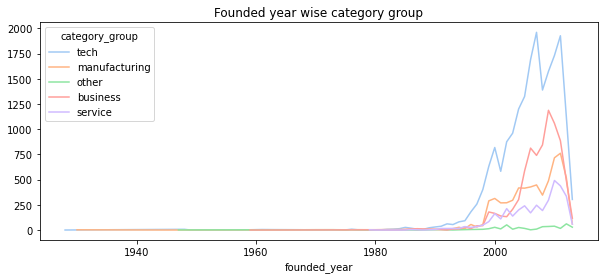

In [76]:
# Graphically representing category group vs founded year
cat_group_year = df_objects_investments_funds[
    df_objects_investments_funds['founded_year'] < 2015
].filter(
    ['founded_year', 'category_group']
).groupby(['founded_year', 'category_group']).size()

plt.figure(figsize=(10,4))
sns.lineplot(
    data = cat_group_year,
    x = 'founded_year',
    y = cat_group_year.values,
    hue = 'category_group',
    palette='pastel'
).set(title='Founded year wise category group')

<h1>Correlation matrix:</h1>
<p>The correlation matrix shows the relationship of pairs of variables in the dataframe.<p>
<p>Coefficients close to 1 indicates a high positive correlation, which means that when one variable of the pair increases, so do the other one.<p>
<p>Coefficients close to -1 indicates a high negative correlation, meaning that when one variable of the pair increases, the other one decreases.<p>
<p>Coefficients close to 0 indicate no correlation between the pair, meaning the variables are independent of each other.<p>

<AxesSubplot:>

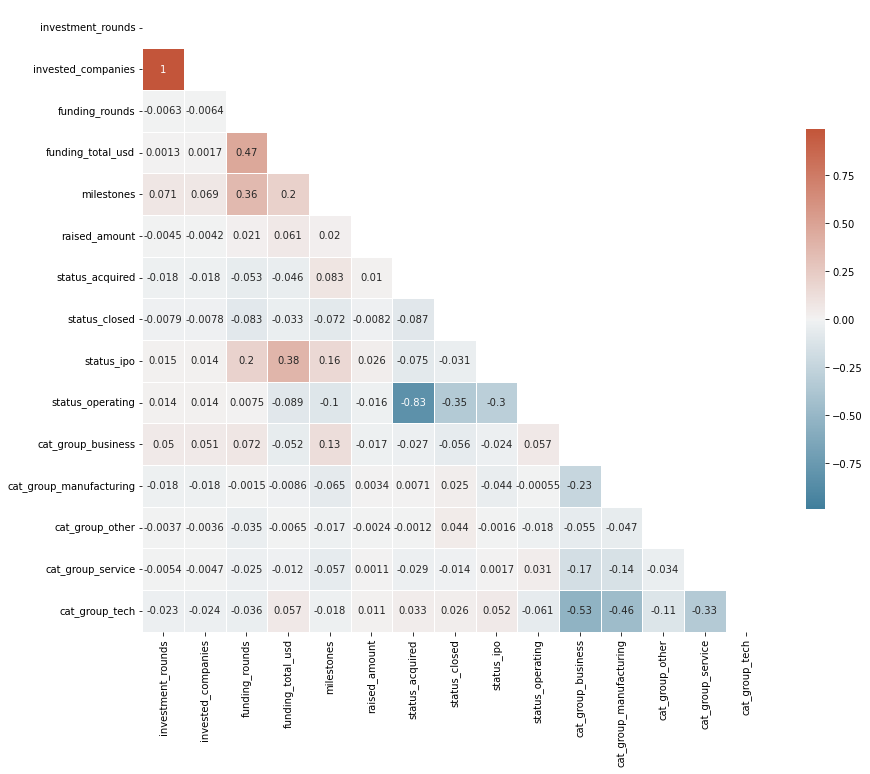

In [77]:
# Compute the correlation matrix
companies_clean_expanded = df_objects_investments_funds.copy()

country_dummies = companies_clean_expanded['country_code'].str.get_dummies()
country_dummies.columns = ['country_' + col for col in country_dummies.columns]

category_dummies = companies_clean_expanded['category_code'].str.get_dummies()
category_dummies.columns = ['category_' + col for col in category_dummies.columns]

status_dummies = companies_clean_expanded['status'].str.get_dummies()
status_dummies.columns = ['status_' + col for col in status_dummies.columns]

category_group_dummies = companies_clean_expanded['category_group'].str.get_dummies()
category_group_dummies.columns = ['cat_group_' + col for col in category_group_dummies.columns]

companies_clean_expanded = pd.concat([companies_clean_expanded, status_dummies], axis=1)
companies_clean_expanded = pd.concat([companies_clean_expanded, category_group_dummies], axis=1)

companies_clean_expanded.drop(['country_code', 'category_code', 'status'], axis=1).head()

corr = companies_clean_expanded.drop(
    labels = [
        'funded_object_id',"investor_object_id", 'name', 'country_code', 'category_code', 'status',
        'founded_year', 'funded_year', 'count'
    ],
    axis = 1,
).corr()
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Generate custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap
plt.figure(figsize=(14,14))
sns.heatmap(
    corr,
    mask = mask,
    cmap = cmap,
    vmax = .99,
    vmin = -.99,
    center = 0,
    square = True,
    linewidths = .5,
    cbar_kws = {'shrink': .5},
    annot = True,
)

Some relations like invested_rounds/invested_companies (+ve), and status_operating/status_acquired (-ve) are obvious and give no usefull information. 
<p>However we can see how "status_ipo" is positively correlated to variables like "funding_total_usd" 
<p>

In [78]:
# Graphically representing using Interactive scatter plot (Can use mouse to view data)
fig = px.scatter_matrix(
    df_objects_investments_funds,
    dimensions= ['status', 'category_group', 'name', 'funding_rounds'],
    hover_name='name'
    # color=''
)
fig.show()

Using this interactive scatter plot for smaller amount of data gives much better information

In [79]:
# Creating a Histogram between Company Status and Investment Rounds
fig = px.scatter(
    data_frame=df_objects_investments_funds,
    x='investment_rounds',
    y='status',
    hover_name='name',
    marginal_y="histogram",
)
fig.show()

<h1> Clustering: <h1>

In [80]:
# Label encoding the data to convert categorical values into numerical values for clustering:
le = LabelEncoder()
df_clusters = df_objects_investments_funds[['category_group', 'status', 'funding_total_usd','country_code']].apply(le.fit_transform)
df_clusters= df_clusters[df_clusters['category_group'] > 0][:5000]
df_clusters.head(3)

,category_group,status,funding_total_usd,country_code
0,4,0,2347,65
1,4,0,2347,65
2,4,0,2347,65


In [81]:
# pip install pyclustering

<b>**K-Medoids Clustering:**</b>

In [82]:
# using K-Medoids for clustering the category group along with founded year
df_clusters =  df_clusters.to_numpy()
# Initialize initial medoids using K-Means++ algorithm
initial_medoids = kmeans_plusplus_initializer(df_clusters, 2).initialize(return_index=True)
 
# Create instance of K-Medoids (PAM) algorithm.
kmedoids_instance = kmedoids(df_clusters, initial_medoids)
 
# Run cluster analysis and obtain results.
kmedoids_instance.process()
clusters = kmedoids_instance.get_clusters()
medoids = kmedoids_instance.get_medoids()

In [83]:
clusters_0 = np.array(clusters[0])
clusters_1 = np.array(clusters[1])

In [84]:
cluster_info = []
for i in range(5000):
    if (i in clusters_0):
        cluster_info.append(0)
    else:
        cluster_info.append(1)

In [85]:
print("For 2 Clusters : \nCH Score:", metrics.calinski_harabasz_score(df_clusters, cluster_info))

For 2 Clusters : 
CH Score: 13399.365399326074


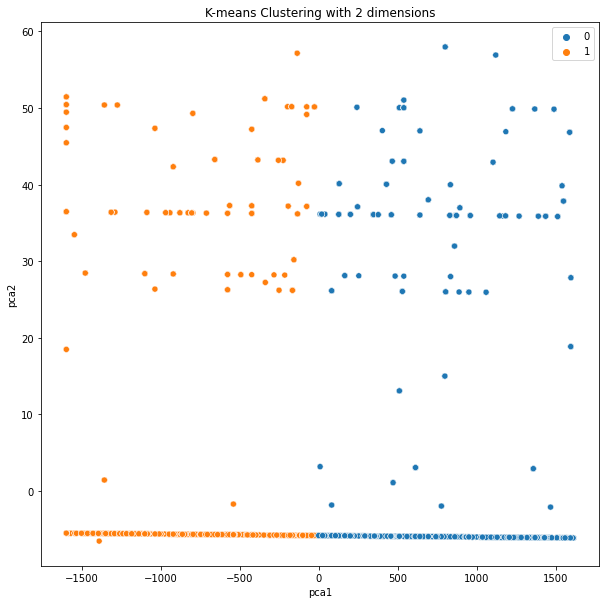

In [86]:
# --- Plot using PCA 2D Plot ---
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(df_clusters)
results = pd.DataFrame(reduced_data,columns=['pca1','pca2'])
fig = plt.figure()
sns.scatterplot(x="pca1", y="pca2", hue=cluster_info, data=results)
plt.title('K-means Clustering with 2 dimensions')
plt.show()

The graph shows 2 different clusters distinctively seperated (0 and 1) 

**KMeans Clustering:**

<p>• Using Calinski Harabasz score to check for best number of clusters possible<p>• Using MinMax Scaler for normalizaition of data (0 to 1) values for better clustering<p>

In [87]:
le = LabelEncoder()
df_fundedC_filter = df_objects_investments_funds[['category_code', 'status', 'funding_total_usd','country_code']]
#df_fundedC_filter = df_objects_investments_funds[['category_code', 'funding_total_usd','country_code']]
# df_fundedC_filter = df_fundedC_filter[:5000]
df_vals = df_fundedC_filter.apply(le.fit_transform)
# -----------------------------------  KMeans Clustering : --------------------
data = df_vals.values
# sc = StandardScaler()
sc = MinMaxScaler()
#print(data)
data = sc.fit_transform(data)
#print(data)
for i in range(9):
    clustering_kmeans = KMeans(n_clusters=i+2)
    var_Clusters = clustering_kmeans.fit_predict(data)
    print("Clusters : ", i+2,"\nCH Score:", metrics.calinski_harabasz_score(data, var_Clusters))

C:\Users\Developer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Clusters :  2 
CH Score: 20017.188316999585


C:\Users\Developer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Clusters :  3 
CH Score: 21524.238757149447


C:\Users\Developer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Clusters :  4 
CH Score: 21764.444167458216


C:\Users\Developer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Clusters :  5 
CH Score: 21368.38194522136


C:\Users\Developer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Clusters :  6 
CH Score: 21500.781648291926


C:\Users\Developer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Clusters :  7 
CH Score: 21547.721028876076


C:\Users\Developer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Clusters :  8 
CH Score: 22485.837309098464


C:\Users\Developer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Clusters :  9 
CH Score: 22265.801464776934


C:\Users\Developer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Clusters :  10 
CH Score: 21572.07904160509


<p>With respect to CH Score, 8 number of clusters may show best results

In [88]:
n_clusters = 8
clustering_kmeans = KMeans(n_clusters=n_clusters)
var_Clusters = clustering_kmeans.fit_predict(data)
print("Clusters : ", n_clusters,"\nCH indicator:", metrics.calinski_harabasz_score(data, var_Clusters))
centroids = clustering_kmeans.cluster_centers_

C:\Users\Developer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Clusters :  8 
CH indicator: 22485.11295320883


<p>Using Principal Component Analysis (PCA) for dimensionality reduction<p>This is required as the no. of variables used in this analysis is 4 which cannot be plotted on 2D or 3D graphs

In [89]:
# --- Plot using PCA 2D Plot ---
def PCA_2D(data,centroids,var_Clusters, title):  
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(data)
    reduced_centroid = pca.transform(centroids)
    #print(reduced_centroid)
    results = pd.DataFrame(reduced_data,columns=['pca1','pca2'])
    results_centroids = pd.DataFrame(reduced_centroid,columns=['pca1','pca2'])
    fig = plt.figure()
    sns.scatterplot(x="pca1", y="pca2", hue=var_Clusters, data=results)
    sns.scatterplot(x="pca1", y="pca2", color='red', data=results_centroids, s=120)
    #plt.title('K-means Clustering with 2 dimensions')
    plt.title(title)
    plt.show()

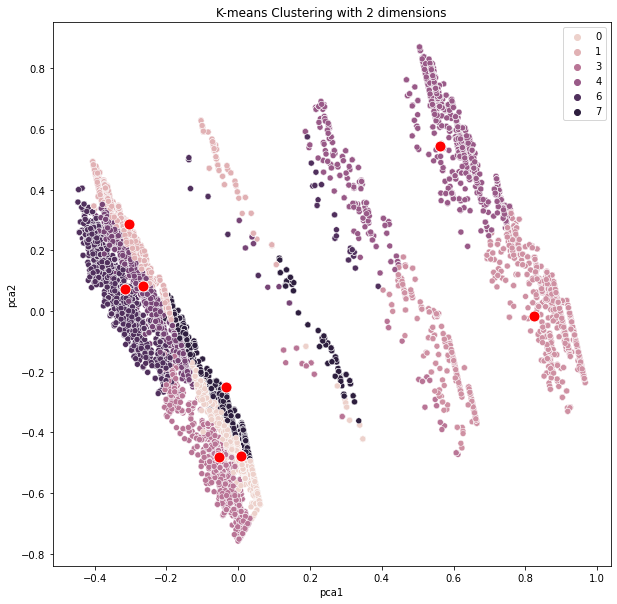

In [90]:
PCA_2D(data,centroids,var_Clusters, title='K-means Clustering with 2 dimensions')

There is a lot of overlap among the clusters. <p>Since, in clustering the objective is to have clear distiction between the clusters, n_clusters = 4 and 2 has been explored as below 

In [91]:
n_clusters = 4
clustering_kmeans = KMeans(n_clusters=n_clusters)
var_Clusters = clustering_kmeans.fit_predict(data)
print("Clusters : ", n_clusters,"\nCH indicator:", metrics.calinski_harabasz_score(data, var_Clusters))
centroids = clustering_kmeans.cluster_centers_

C:\Users\Developer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Clusters :  4 
CH indicator: 21764.444167458216


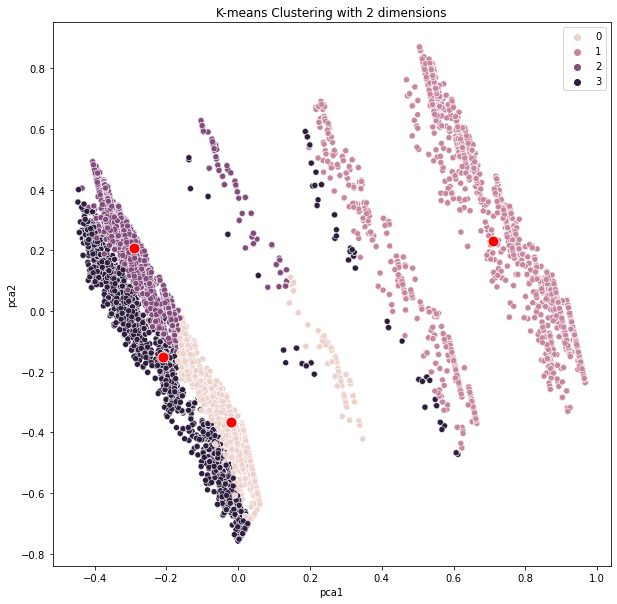

In [92]:
PCA_2D(data,centroids,var_Clusters, title='K-means Clustering with 2 dimensions')

From the graph above, same as n_clusters = 8 , n_clusters = 4 is also not suitable for this

In [93]:
n_clusters = 2
clustering_kmeans = KMeans(n_clusters=n_clusters)
var_Clusters = clustering_kmeans.fit_predict(data)
print("Clusters : ", n_clusters,"\nCH indicator:", metrics.calinski_harabasz_score(data, var_Clusters))
centroids = clustering_kmeans.cluster_centers_

C:\Users\Developer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Clusters :  2 
CH indicator: 20017.188316999585


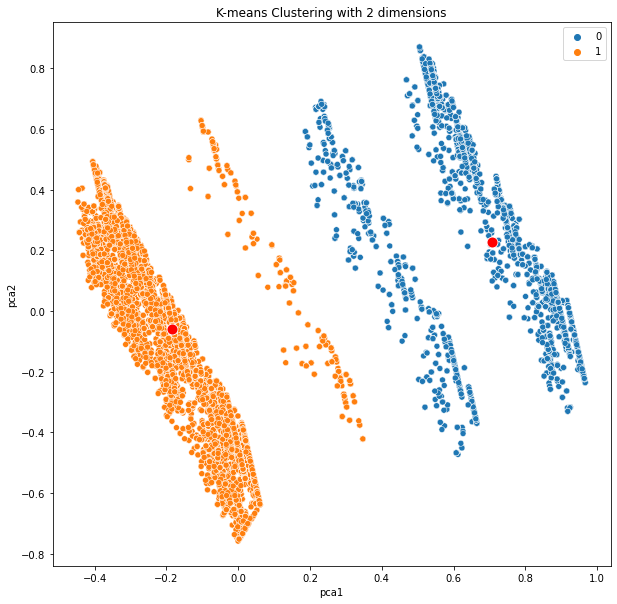

In [94]:
PCA_2D(data, centroids, var_Clusters, title = 'K-means Clustering with 2 dimensions')

From the above PCA graph, a clear distinction between the 2 clusters is seen<p>Below is 3D graph using PCA approach for clustering using n_clusters = 2 only

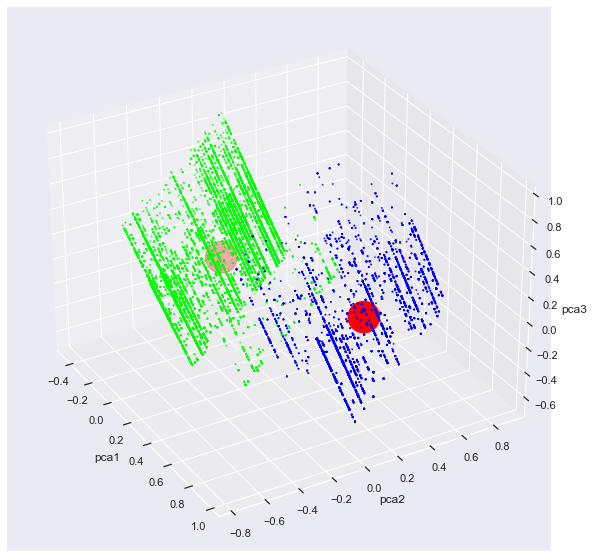

In [95]:
# ---------- 3D Plot ---------- :
sns.set(style = "darkgrid")
# Fit n Transform
pca = PCA(n_components=3)
reduced_data = pca.fit_transform(data)
reduced_centroid = pca.transform(centroids)
results = pd.DataFrame(reduced_data,columns=['pca1','pca2','pca3'])
# Set
x = results['pca1']
y = results['pca2']
z = results['pca3']
#
x_cent = reduced_centroid[:,0]
y_cent = reduced_centroid[:,1]
z_cent = reduced_centroid[:,2]
#
fig = plt.figure()
ax = fig.add_subplot(111, projection = '3d')
ax.set_xlabel("pca1")
ax.set_ylabel("pca2")
ax.set_zlabel("pca3")
# Plot:
color_map = plt.get_cmap('brg') # brg (blue-green) , spring (yellow-pink) , hsv
ax.scatter3D(x_cent, y_cent, z_cent, c='red', s=1000 )
ax.scatter3D(x, y, z, c=var_Clusters, cmap = color_map, s=1)
ax.view_init(30, -30)

From 3D PCA graph, clear distinction between the 2 clusters is observed

**Gaussian Mix Clustering:**

In [96]:
for i in range(9):
    clustering_Gauss = GaussianMixture(n_components=i+2)
    var_Clusters = clustering_Gauss.fit_predict(data)
    print("Clusters : ", i+2,"\nCH indicator:", metrics.calinski_harabasz_score(data, var_Clusters))

Clusters :  2 
CH indicator: 18829.558486304788
Clusters :  3 
CH indicator: 19154.653539445404
Clusters :  4 
CH indicator: 11737.233146375078
Clusters :  5 
CH indicator: 9321.367380451153
Clusters :  6 
CH indicator: 8656.540727787373
Clusters :  7 
CH indicator: 11368.35143294335
Clusters :  8 
CH indicator: 10276.56486218583
Clusters :  9 
CH indicator: 12330.021786352912
Clusters :  10 
CH indicator: 13445.97414899664


In [97]:
n_clusters = 2
clustering_Gauss = GaussianMixture(n_components=n_clusters)
var_Clusters = clustering_Gauss.fit_predict(data)
print("Clusters : ", n_clusters,"\nCH Score:", metrics.calinski_harabasz_score(data, var_Clusters))

Clusters :  2 
CH Score: 18829.558486304788


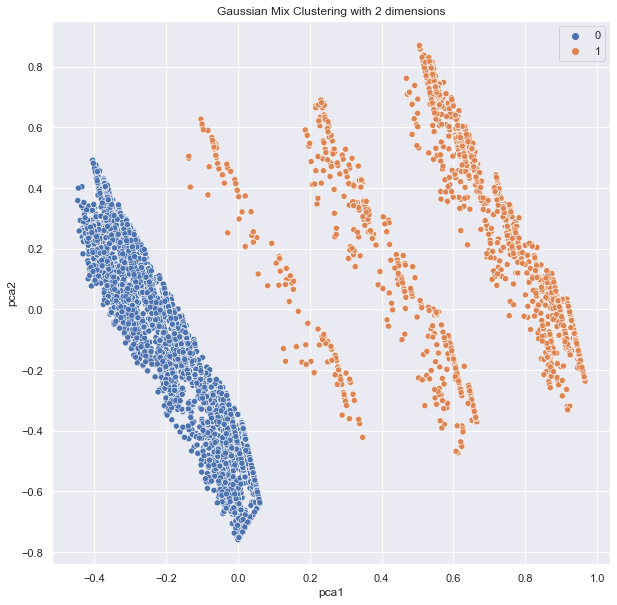

In [98]:
# --- Plot using PCA ---
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(data)
results = pd.DataFrame(reduced_data,columns=['pca1','pca2'])
fig = plt.figure()
sns.scatterplot(x="pca1", y="pca2", hue=var_Clusters, data=results)
plt.title('Gaussian Mix Clustering with 2 dimensions')
plt.show()

As per Gaussian Mix Clustering algorithm, n_clusters = 2 shows best results similar to KMeans Clustering

**Network Graphs:**

Network Graph of 1st 5000 investment companies and investors:


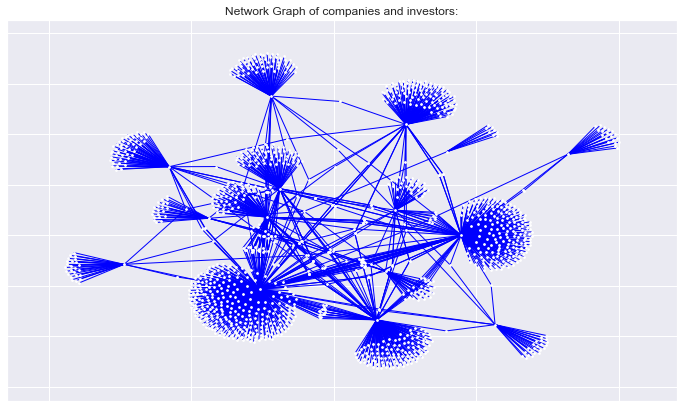

In [99]:
# generate network graph
print("Network Graph of 1st 5000 investment companies and investors:")
df_temp_sd2_short = df_objects_investments_funds[:5000]
G = plt.figure(figsize=(12, 7))
G = nx.Graph()
for i, j in zip(df_temp_sd2_short["funded_object_id"], df_temp_sd2_short["investor_object_id"]):
    G.add_edge(i, j, weight=1)
# Positions of all nodes
pos = nx.spring_layout(G)
# Nodes & edges
nx.draw_networkx_nodes(G, pos, node_size=3, node_color="white")
nx.draw_networkx_edges(G, pos, edgelist=G.edges, width=1, alpha=1, edge_color='blue')
plt.title("Network Graph of companies and investors:")
plt.show()

From Network graph connections between funded objects and investors is seen for 5000 entries<p>One company funded may fund another comapany also. This interconnection is clearly visible from Network graph

<h1>Cluster Analysis</h1>

<h3>Decision Tree Classification</h3>

In [100]:
# K-Means Clustering (2 Clusters)
le = LabelEncoder()
df_fundedC_filter = df_objects_investments_funds[['category_code', 'status', 'funding_total_usd','country_code']]
df_vals = df_fundedC_filter.apply(le.fit_transform)
# -----------------------------------  KMeans Clustering : --------------------
data = df_vals.values
# sc = StandardScaler()
sc = MinMaxScaler()
#print(data)
data = sc.fit_transform(data)
#print(data)

In [101]:
n_clusters = 2
clustering_kmeans = KMeans(n_clusters=n_clusters)
var_Clusters = clustering_kmeans.fit_predict(data)
print("Clusters : ", n_clusters,"\nCH indicator:", metrics.calinski_harabasz_score(data, var_Clusters))

C:\Users\Developer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Clusters :  2 
CH indicator: 20017.188316999585


In [102]:
raw_df = df_objects_investments_funds
raw_df['var_Clusters'] = var_Clusters

In [103]:
le = LabelEncoder()
cols_x = ['entity_type',
       'category_code', 'status', 'country_code',
       'investment_rounds', 'invested_companies', 'funding_rounds',
       'funding_total_usd', 'milestones', 'raised_amount',
       'raised_currency_code', 'founded_year', 'funded_year', 'count',
       'category_group']
dataset = raw_df[cols_x].apply(le.fit_transform)
dataset['Class'] = raw_df['var_Clusters']

In [104]:
counter = Counter(dataset['Class'])
for k,v in counter.items():
  per = v / len(dataset) * 100
  print('Class=%d, Count=%d, Percentage=%.3f%%' % (k, v, per))

Class=0, Count=7811, Percentage=20.645%
Class=1, Count=30024, Percentage=79.355%


As seen above, clusters show some bias since clustering is in ratio 80:20

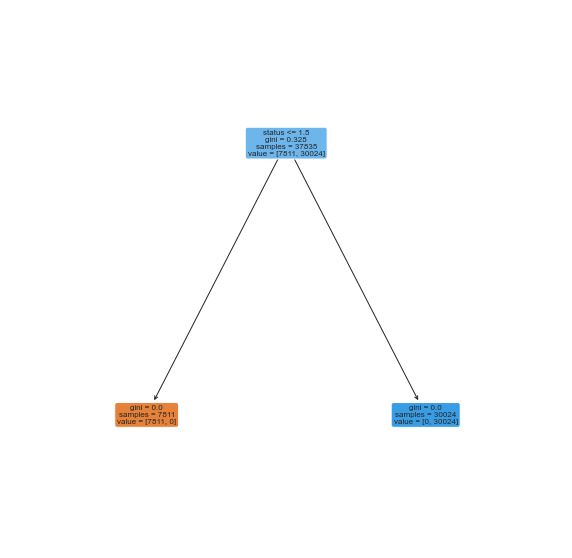

In [105]:
X_train =dataset[cols_x].values
y_train = dataset['Class'].values
#
DTC = DecisionTreeClassifier()
clf = DTC.fit(X_train,y_train)
y_pred = clf.predict(X_train)
#
fig = plt.figure()
a = tree.plot_tree(clf,feature_names=cols_x, filled=True, rounded=True, fontsize=8)

From the decision tree, it is clear that "Status" column is the reason behind this clustering. It is generally expected to take into account contribution of all columns/variables. This is explored further by removing the bias causing variable "status"

In [106]:
# K-Means Clustering (2 Clusters) - Removal of "STATUS" variable from analyses
le = LabelEncoder()
#df_fundedC_filter = df_objects_investments_funds[['category_code', 'status', 'funding_total_usd','country_code']]
df_fundedC_filter = df_objects_investments_funds[['category_code', 'funding_total_usd','country_code']]
df_vals = df_fundedC_filter.apply(le.fit_transform)
# -----------------------------------  KMeans Clustering : --------------------
data = df_vals.values
# sc = StandardScaler()
sc = MinMaxScaler()
#print(data)
data = sc.fit_transform(data)
#print(data)
n_clusters = 2
clustering_kmeans = KMeans(n_clusters=n_clusters)
var_Clusters = clustering_kmeans.fit_predict(data)
print("Clusters : ", n_clusters,"\nCH indicator:", metrics.calinski_harabasz_score(data, var_Clusters))

C:\Users\Developer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Clusters :  2 
CH indicator: 22065.23383180202


As seen above, CH Score is improved, which is good for clustering

In [107]:
raw_df = df_objects_investments_funds
raw_df['var_Clusters'] = var_Clusters
le = LabelEncoder()
cols_x = ['entity_type',
       'category_code', 'status', 'country_code',
       'investment_rounds', 'invested_companies', 'funding_rounds',
       'funding_total_usd', 'milestones', 'raised_amount',
       'raised_currency_code', 'founded_year', 'funded_year', 'count',
       'category_group']
dataset = raw_df[cols_x].apply(le.fit_transform)
dataset['Class'] = raw_df['var_Clusters']

In [108]:
counter = Counter(dataset['Class'])
for k,v in counter.items():
    per = v / len(dataset) * 100
    print('Class=%d, Count=%d, Percentage=%.3f%%' % (k, v, per))

Class=0, Count=17161, Percentage=45.357%
Class=1, Count=20674, Percentage=54.643%


By using this, clustering ratio is more uniform 45:54

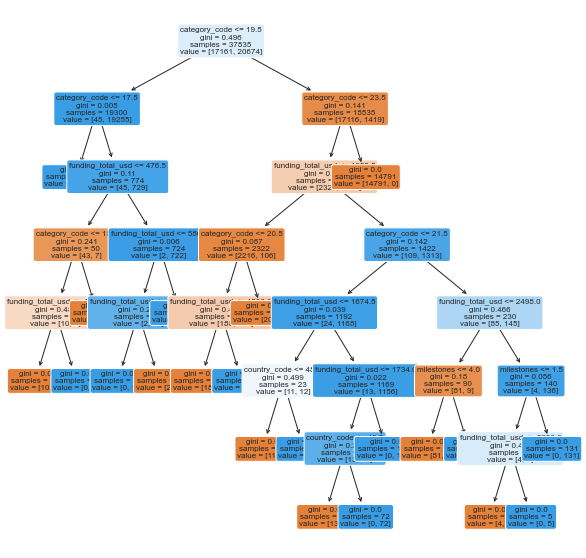

In [109]:
X_train =dataset[cols_x].values
y_train = dataset['Class'].values
#
DTC = DecisionTreeClassifier()
clf = DTC.fit(X_train,y_train)
y_pred = clf.predict(X_train)
#
fig = plt.figure()
a = tree.plot_tree(clf,feature_names=cols_x, filled=True, rounded=True, fontsize=8)

The above Decision Tree shows contribution of all the variables selected for clustering. This is useful to understand the effect of each chosen variable and can help in making sound decisions for companies and investors.

<h1>Thank you</h1>